<a href="https://colab.research.google.com/github/dragoblud/Recipe-ON-predicted-images/blob/main/Ingredient-predictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fruit and Vegetable Classification
Having 3861 images of 36 different fruits/vegetables

![fruit vegetable](https://i.imgur.com/KUAcIQD.jpeg)

# Context

This dataset contains images of the following food items:

- **fruits**: banana, apple, pear, grapes, orange, kiwi, watermelon, pomegranate, pineapple, mango
- **vegetables**: cucumber, carrot, capsicum, onion, potato, lemon, tomato, raddish, beetroot, cabbage, lettuce, spinach, soy bean, cauliflower, bell pepper, chilli pepper, turnip, corn, sweetcorn, sweet potato, paprika, jalepeño, ginger, garlic, peas, eggplant

# Content
This dataset contains three folders:

- train (100 images each)
- test (10 images each)
- validation (10 images each)
each of the above folders contains subfolders for different fruits and vegetables wherein the images for respective food items are present# Context

This dataset contains images of the following food items:

- **fruits**: banana, apple, pear, grapes, orange, kiwi, watermelon, pomegranate, pineapple, mango
- **vegetables**: cucumber, carrot, capsicum, onion, potato, lemon, tomato, raddish, beetroot, cabbage, lettuce, spinach, soy bean, cauliflower, bell pepper, chilli pepper, turnip, corn, sweetcorn, sweet potato, paprika, jalepeño, ginger, garlic, peas, eggplant

# Content
This dataset contains three folders:

- train (100 images each)
- test (10 images each)
- validation (10 images each)
each of the above folders contains subfolders for different fruits and vegetables wherein the images for respective food items are present


# 1. Pre-requirements<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
!pip install silence_tensorflow

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for silence_tensorflow: filename=silence_tensorflow-1.2.1-py3-none-any.whl size=4465 sha256=990fa01a377364392cc40d893f007059ef3ecc3b23b474a4e860664f3e857945
  Stored in directory: /root/.cache/pip/wheels/7d/2c/24/e130d6102c0df56631b9db7479d9a6a53c5d97fb06b5f61b98
  Created wheel for support_developer: filename=support_developer-1.0.5-py3-none-any.whl size=5630 sha256=032553d5f2bda3ae1fb72a9d7a2077d31dd74623ebb54aac2d1eaa01bd35fba3
  Stored in directory: /root/.cache/pip/wheels/b6/72/c8/3054a5897ba0713dfa7a941364d68cbd42b0755c8e2ec1c18c
Successfully built silence_tensorflow support_developer


In [ ]:
# A function to avoid tensorflow warnings
from silence_tensorflow import silence_tensorflow
silence_tensorflow()

In [ ]:
from google.colab import drive
drive.mount('./MyDrive')

Mounted at ./MyDrive


# 2. Loading and preprocessing<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
import tensorflow as tf

In [ ]:
# Define data paths (modify based on your actual structure)
data_dir = "/content/MyDrive/MyDrive/archive"
train_dir = os.path.join(data_dir, "train")
test_dir = os.path.join(data_dir, "test")
validation_dir = os.path.join(data_dir, "validation")

In [ ]:
# Create a list with the filepaths for training, testing and validation
train_filepaths = list(Path(train_dir).glob(r'**/*.jpg'))
test_filepaths = list(Path(test_dir).glob(r'**/*.jpg'))
val_filepaths = list(Path(validation_dir).glob(r'**/*.jpg'))

def proc_img(filepath):
    """ Create a DataFrame with the filepath and the labels of the pictures
    """

    labels = [str(filepath[i]).split("/")[-2] \
              for i in range(len(filepath))]

    filepath = pd.Series(filepath, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels
    df = pd.concat([filepath, labels], axis=1)

    # Shuffle the DataFrame and reset index
    df = df.sample(frac=1).reset_index(drop = True)

    return df

train_df = proc_img(train_filepaths)
test_df = proc_img(test_filepaths)
val_df = proc_img(val_filepaths)

In [ ]:
print('-- Training set --\n')
print(f'Number of pictures: {train_df.shape[0]}\n')
print(f'Number of different labels: {len(train_df.Label.unique())}\n')
print(f'Labels: {train_df.Label.unique()}')

-- Training set --

Number of pictures: 2790

Number of different labels: 36

Labels: ['cauliflower' 'lettuce' 'beetroot' 'onion' 'raddish' 'turnip' 'banana'
 'sweetcorn' 'cabbage' 'garlic' 'eggplant' 'carrot' 'soy beans' 'orange'
 'jalepeno' 'pomegranate' 'spinach' 'mango' 'pear' 'sweetpotato' 'tomato'
 'corn' 'capsicum' 'peas' 'bell pepper' 'chilli pepper' 'pineapple'
 'ginger' 'potato' 'kiwi' 'paprika' 'grapes' 'lemon' 'apple' 'watermelon'
 'cucumber']


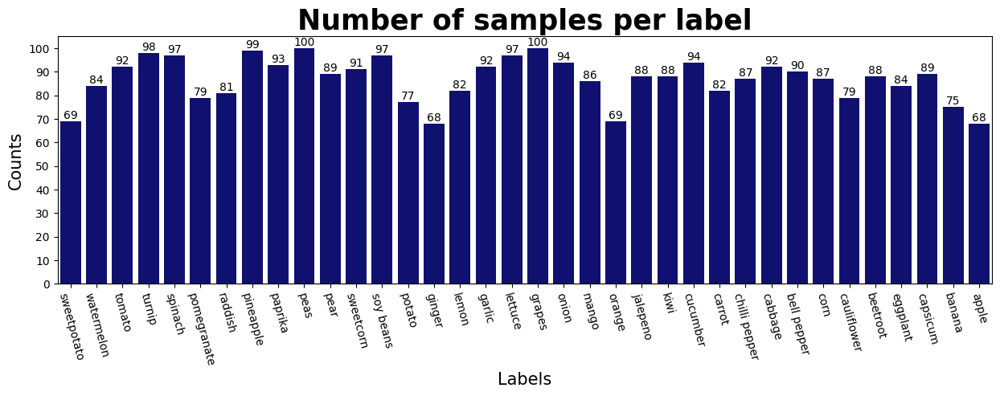

In [ ]:
import seaborn as sns

classes = [class_name for class_name in os.listdir(train_dir)]
count = []
for class_name in classes :
    count.append(len(os.listdir(os.path.join(train_dir, class_name))))

plt.figure(figsize=(15, 4))
ax = sns.barplot(x=classes, y=count, color='navy')
plt.xticks(rotation=285)
for i in ax.containers:
    ax.bar_label(i,)
plt.title('Number of samples per label', fontsize=25, fontweight='bold')
plt.xlabel('Labels', fontsize=15)
plt.ylabel('Counts', fontsize=15)
plt.yticks(np.arange(0, 105, 10))
plt.show()

In [ ]:
# The DataFrame with the filepaths in one column and the labels in the other one
train_df.head(5)

,Filepath,Label
0,/content/MyDrive/MyDrive/archive/train/caulifl...,cauliflower
1,/content/MyDrive/MyDrive/archive/train/lettuce...,lettuce
2,/content/MyDrive/MyDrive/archive/train/beetroo...,beetroot
3,/content/MyDrive/MyDrive/archive/train/onion/I...,onion
4,/content/MyDrive/MyDrive/archive/train/raddish...,raddish


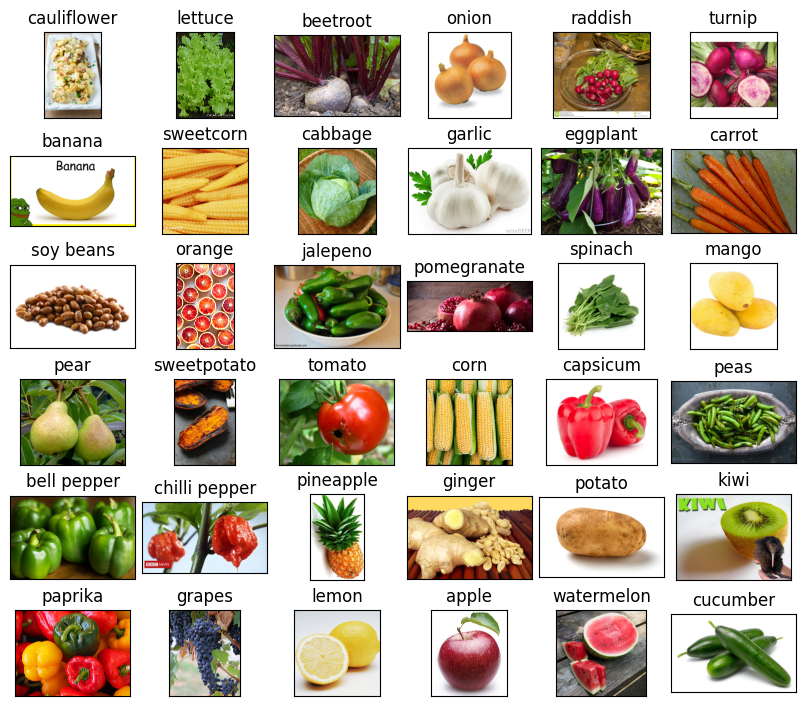

In [ ]:
# Create a DataFrame with one Label of each category
df_unique = train_df.copy().drop_duplicates(subset=["Label"]).reset_index()

# Display some pictures of the dataset
fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(8, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(df_unique.Filepath[i]))
    ax.set_title(df_unique.Label[i], fontsize = 12)
plt.tight_layout(pad=0.5)
plt.show()

# 3. VGG_16 Model<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

## 1. Load the Images with a generator and Data Augmentation<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input
)

train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)


Found 2790 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.


In [ ]:
# Load the pretrained model
pretrained_model = tf.keras.applications.VGG16(
    input_shape=(416, 416, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)
pretrained_model.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


## 2. Train the model<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(36, activation='softmax')(x)
model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
88/88 [==============================] - 1829s 21s/step - loss: 3.0001 - accuracy: 0.3527 - val_loss: 0.7948 - val_accuracy: 0.7725
Epoch 2/10
88/88 [==============================] - 1780s 20s/step - loss: 0.9657 - accuracy: 0.7280 - val_loss: 0.4362 - val_accuracy: 0.8653
Epoch 3/10
88/88 [==============================] - 1774s 20s/step - loss: 0.5467 - accuracy: 0.8341 - val_loss: 0.2793 - val_accuracy: 0.9341
Epoch 4/10
88/88 [==============================] - 1792s 20s/step - loss: 0.3485 - accuracy: 0.8918 - val_loss: 0.2201 - val_accuracy: 0.9461
Epoch 5/10
88/88 [==============================] - 1798s 20s/step - loss: 0.2296 - accuracy: 0.9315 - val_loss: 0.2354 - val_accuracy: 0.9371
Epoch 6/10
88/88 [==============================] - 1817s 21s/step - loss: 0.1505 - accuracy: 0.9573 - val_loss: 0.1888 - val_accuracy: 0.9611
Epoch 7/10
88/88 [==============================] - 1804s 21s/step - loss: 0.1146 - accuracy: 0.9706 - val_loss: 0.1822 - val_accuracy: 0.9581

In [ ]:
result_df = pd.DataFrame(history.history)
result_df.tail()

,loss,accuracy,val_loss,val_accuracy
5,0.150460,0.957348,0.188828,0.961078
6,0.114633,0.970609,0.182229,0.958084
7,0.090265,0.976344,0.177770,0.952096
8,0.073876,0.980287,0.188101,0.952096
9,0.056791,0.985305,0.168980,0.970060


In [ ]:
# Convert the DataFrame to JSON
result_json = result_df.to_json(orient="records")

# Write the JSON data to a file
with open('vgg16.json', 'w') as f:
    f.write(result_json)


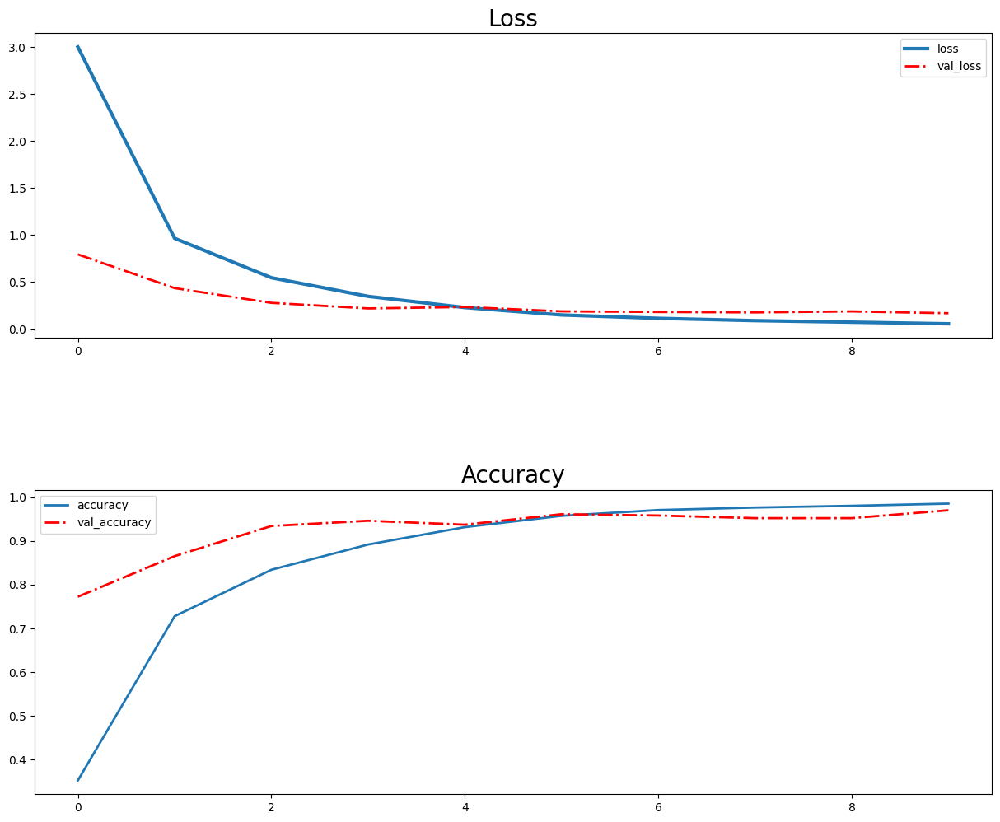

In [ ]:
result_df = pd.read_json('vgg16.json')

x = np.arange(len(result_df))
fig, ax = plt.subplots(2, 1, figsize=(15, 12))

# AX0 : Loss
ax[0].plot(x, result_df.loss, label='loss', linewidth=3)
ax[0].plot(x, result_df.val_loss, label='val_loss', linewidth=2, ls='-.', c='r')
ax[0].set_title('Loss', fontsize=20)
ax[0].legend()

# AX1 : Accuracy
ax[1].plot(x, result_df.accuracy, label='accuracy', linewidth=2)
ax[1].plot(x, result_df.val_accuracy, label='val_accuracy', linewidth=2, ls='-.', c='r')
ax[1].set_title('Accuracy', fontsize=20)
ax[1].legend()

plt.subplots_adjust(hspace=0.5)
plt.show()

## 3. Visualize the result<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

11/11 [==============================] - 213s 19s/step


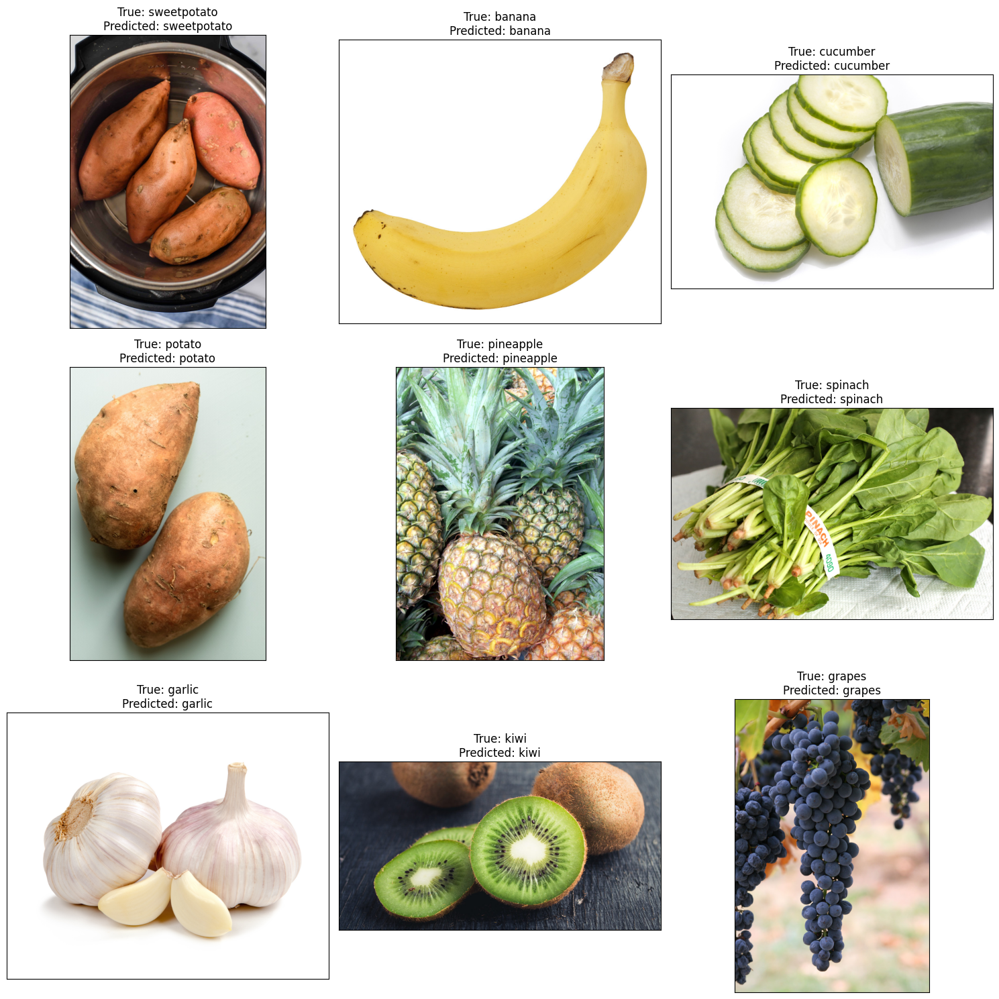

In [ ]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

y_test = [labels[k] for k in test_images.classes]

# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, pred)
print(f'Accuracy on the test set: {100*acc:.2f}%')

Accuracy on the test set: 97.01%


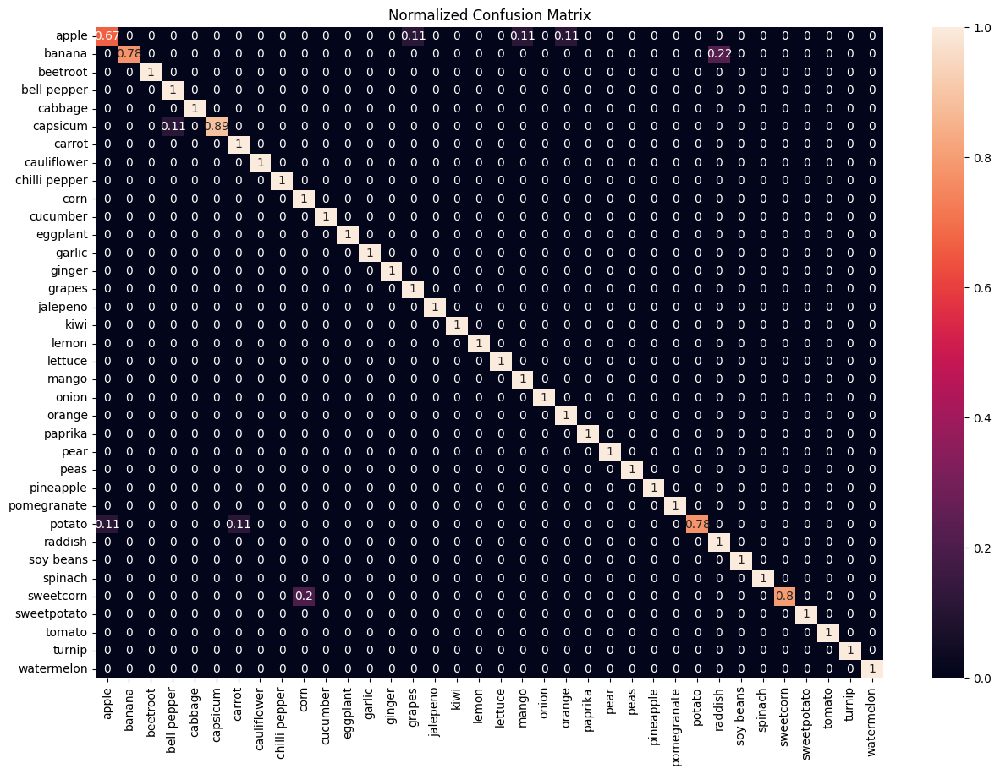

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (15,10))
sns.heatmap(cf_matrix,
            annot=True,
            xticklabels = sorted(set(y_test)),
            yticklabels = sorted(set(y_test)),
            )
plt.title('Normalized Confusion Matrix')
plt.show()

1/1 [==============================] - 2s 2s/step


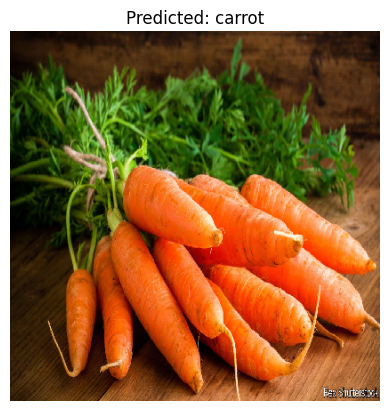

'carrot'

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_image_class(model, image_path, show=True):
    img = image.load_img(image_path, target_size=(416, 416))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = tf.keras.applications.vgg16.preprocess_input(expanded_img_array)
    prediction = model.predict(preprocessed_img)
    predicted_class = np.argmax(prediction, axis=1)

    # Assuming 'class_indices' is a dictionary mapping class names to their index
    # Replace 'class_indices' with the actual variable name in your code
    class_indices = train_images.class_indices
    # Invert the dictionary
    index_to_class = {v: k for k, v in class_indices.items()}
    # Get the class name
    predicted_class_name = index_to_class[predicted_class[0]]

    if show:
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {predicted_class_name}')
        plt.show()

    return predicted_class_name

# Assuming 'model' is your trained model
# Replace 'path_to_your_image.jpg' with the actual path to your image
predict_image_class(model, '/content/MyDrive/MyDrive/archive/test/carrot/Image_1.jpg')


In [ ]:
!mkdir -p saved_model
model.save('saved_model/VGG_16_Predictor')
!zip -r VGG_16_Predictor.zip saved_model/VGG_16_Predictor/

  adding: saved_model/VGG_16_Predictor/ (stored 0%)
  adding: saved_model/VGG_16_Predictor/keras_metadata.pb (deflated 95%)
  adding: saved_model/VGG_16_Predictor/variables/ (stored 0%)
  adding: saved_model/VGG_16_Predictor/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: saved_model/VGG_16_Predictor/variables/variables.index (deflated 68%)
  adding: saved_model/VGG_16_Predictor/fingerprint.pb (stored 0%)
  adding: saved_model/VGG_16_Predictor/saved_model.pb (deflated 90%)
  adding: saved_model/VGG_16_Predictor/assets/ (stored 0%)


# 4. RESNET_50 model<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

## 1. Load the Images with a generator and Data Augmentation<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input
)

train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)


Found 2790 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.


In [ ]:
# Load the pretrained model
pretrained_model_resnet50 = tf.keras.applications.ResNet50(
    input_shape=(416, 416, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)
pretrained_model_resnet50.trainable = False

94765736/94765736 [==============================] - 4s 0us/step


## 2. Train the model<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
inputs = pretrained_model_resnet50.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model_resnet50.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(36, activation='softmax')(x)
model_resnet = tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
model_resnet.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_resnet = model_resnet.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
88/88 [==============================] - 2564s 29s/step - loss: 1.5843 - accuracy: 0.5720 - val_loss: 0.4072 - val_accuracy: 0.8713
Epoch 2/10
88/88 [==============================] - 697s 8s/step - loss: 0.5080 - accuracy: 0.8398 - val_loss: 0.2392 - val_accuracy: 0.9132
Epoch 3/10
88/88 [==============================] - 684s 8s/step - loss: 0.2977 - accuracy: 0.8996 - val_loss: 0.1965 - val_accuracy: 0.9371
Epoch 4/10
88/88 [==============================] - 696s 8s/step - loss: 0.1914 - accuracy: 0.9394 - val_loss: 0.1800 - val_accuracy: 0.9521
Epoch 5/10
88/88 [==============================] - 692s 8s/step - loss: 0.1206 - accuracy: 0.9677 - val_loss: 0.1668 - val_accuracy: 0.9491
Epoch 6/10
88/88 [==============================] - 679s 8s/step - loss: 0.1380 - accuracy: 0.9588 - val_loss: 0.1691 - val_accuracy: 0.9461
Epoch 7/10
88/88 [==============================] - 687s 8s/step - loss: 0.0746 - accuracy: 0.9742 - val_loss: 0.1621 - val_accuracy: 0.9611
Epoch 8/10


In [ ]:
result_df = pd.DataFrame(history_resnet.history)
result_df.tail()

,loss,accuracy,val_loss,val_accuracy
5,0.138025,0.958781,0.169071,0.946108
6,0.074573,0.974194,0.162097,0.961078
7,0.068919,0.978136,0.142065,0.964072
8,0.052623,0.985305,0.160828,0.961078
9,0.046372,0.986738,0.135289,0.964072


In [ ]:
# Convert the DataFrame to JSON
result_json = result_df.to_json(orient="records")

# Write the JSON data to a file
with open('resnet50.json', 'w') as f:
    f.write(result_json)


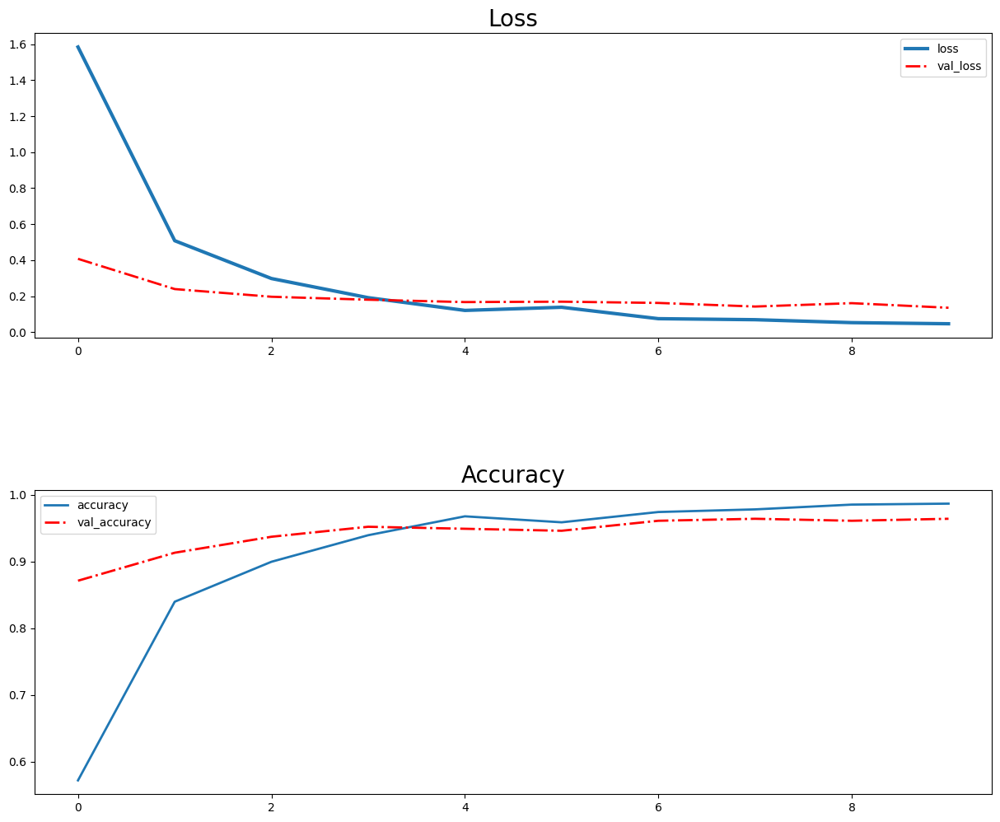

In [ ]:
result_df = pd.read_json('resnet50.json')

x = np.arange(len(result_df))
fig, ax = plt.subplots(2, 1, figsize=(15, 12))

# AX0 : Loss
ax[0].plot(x, result_df.loss, label='loss', linewidth=3)
ax[0].plot(x, result_df.val_loss, label='val_loss', linewidth=2, ls='-.', c='r')
ax[0].set_title('Loss', fontsize=20)
ax[0].legend()

# AX1 : Accuracy
ax[1].plot(x, result_df.accuracy, label='accuracy', linewidth=2)
ax[1].plot(x, result_df.val_accuracy, label='val_accuracy', linewidth=2, ls='-.', c='r')
ax[1].set_title('Accuracy', fontsize=20)
ax[1].legend()

plt.subplots_adjust(hspace=0.5)
plt.show()

## 3. Visualize the result<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

11/11 [==============================] - 192s 18s/step


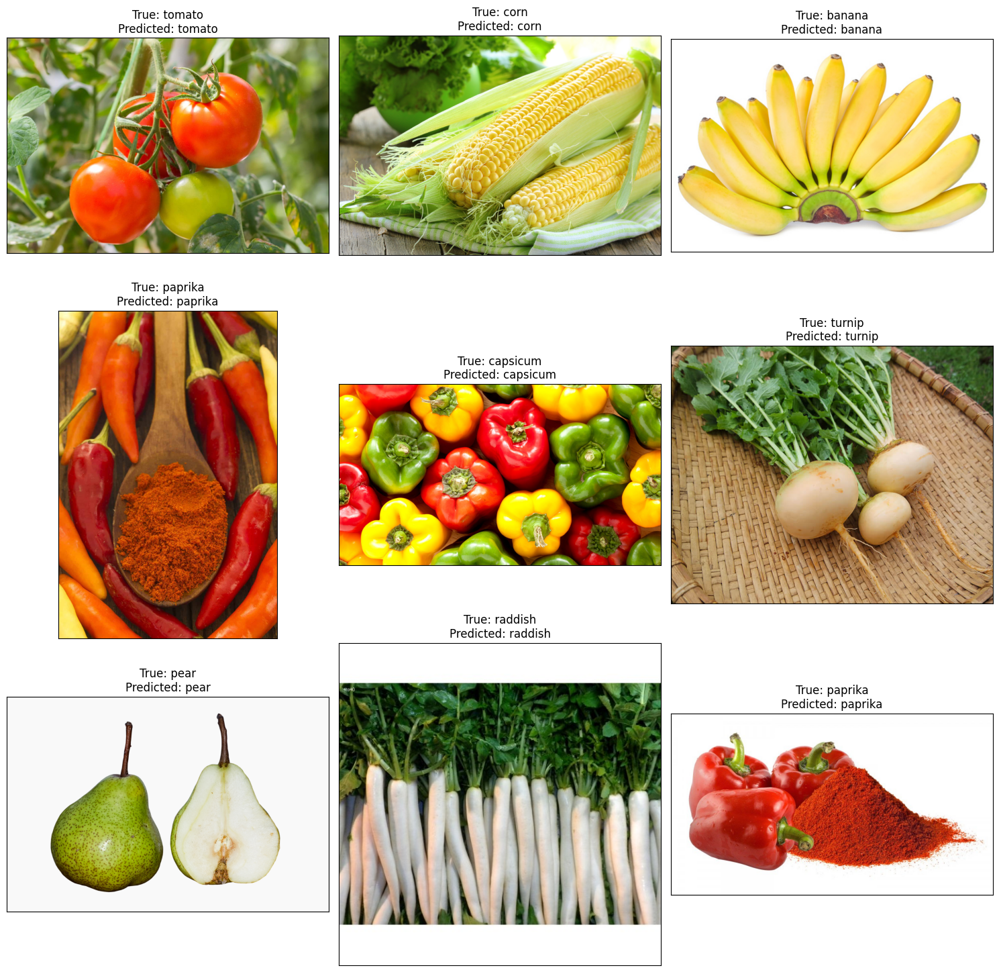

In [ ]:
# Predict the label of the test_images
pred = model_resnet.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

y_test = [labels[k] for k in test_images.classes]

# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, pred)
print(f'Accuracy on the test set: {100*acc:.2f}%')

Accuracy on the test set: 96.41%


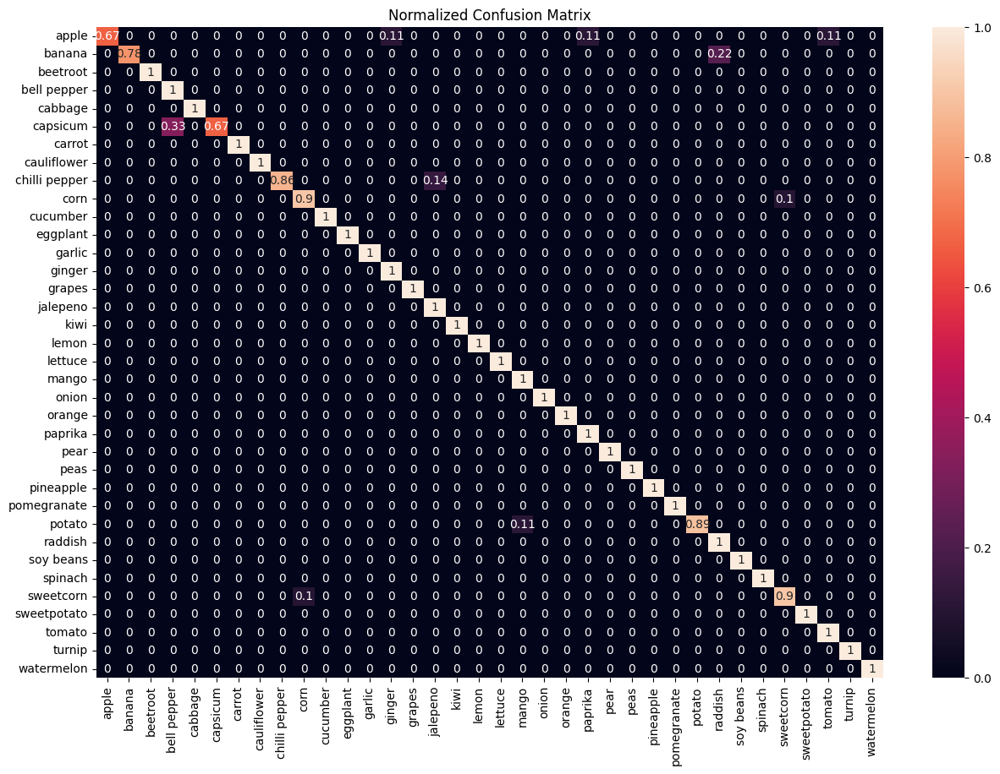

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (15,10))
sns.heatmap(cf_matrix,
            annot=True,
            xticklabels = sorted(set(y_test)),
            yticklabels = sorted(set(y_test)),
            )
plt.title('Normalized Confusion Matrix')
plt.show()

1/1 [==============================] - 5s 5s/step


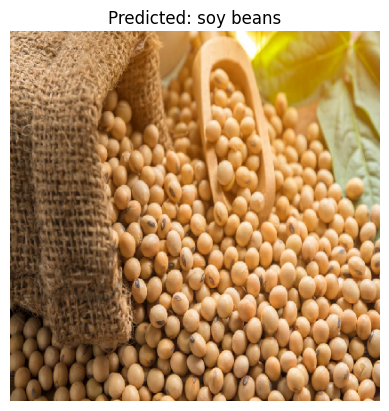

'soy beans'

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_image_class(model, image_path, show=True):
    img = image.load_img(image_path, target_size=(416, 416))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = tf.keras.applications.vgg16.preprocess_input(expanded_img_array)
    prediction = model.predict(preprocessed_img)
    predicted_class = np.argmax(prediction, axis=1)

    # Assuming 'class_indices' is a dictionary mapping class names to their index
    class_indices = train_images.class_indices
    # Invert the dictionary
    index_to_class = {v: k for k, v in class_indices.items()}
    # Get the class name
    predicted_class_name = index_to_class[predicted_class[0]]

    if show:
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {predicted_class_name}')
        plt.show()

    return predicted_class_name

# Assuming 'model' is your trained model
# Replace 'path_to_your_image.jpg' with the actual path to your image
predict_image_class(model_resnet, '/content/MyDrive/MyDrive/archive/test/soy beans/Image_1.jpg')


1/1 [==============================] - 1s 1s/step


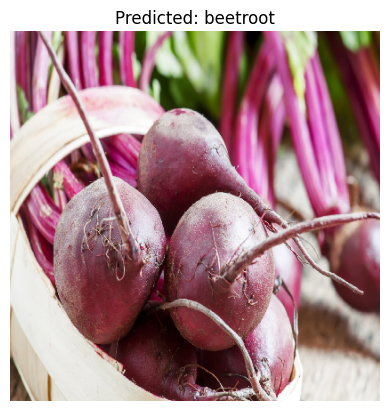

'beetroot'

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_image_class(model, image_path, show=True):
    img = image.load_img(image_path, target_size=(416, 416))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = tf.keras.applications.vgg16.preprocess_input(expanded_img_array)
    prediction = model.predict(preprocessed_img)
    predicted_class = np.argmax(prediction, axis=1)

    # Assuming 'class_indices' is a dictionary mapping class names to their index
    # Replace 'class_indices' with the actual variable name in your code
    class_indices = train_images.class_indices
    # Invert the dictionary
    index_to_class = {v: k for k, v in class_indices.items()}
    # Get the class name
    predicted_class_name = index_to_class[predicted_class[0]]

    if show:
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {predicted_class_name}')
        plt.show()

    return predicted_class_name

# Assuming 'model' is your trained model
# Replace 'path_to_your_image.jpg' with the actual path to your image
predict_image_class(model_resnet, '/content/MyDrive/MyDrive/archive/test/beetroot/Image_10.jpg')


In [ ]:
model_resnet.save('saved_model/RESNET_50_Predictor')
!zip -r RESNET_50_Predictor.zip saved_model/RESNET_50_Predictor/

  adding: saved_model/RESNET_50_Predictor/ (stored 0%)
  adding: saved_model/RESNET_50_Predictor/fingerprint.pb (stored 0%)
  adding: saved_model/RESNET_50_Predictor/variables/ (stored 0%)
  adding: saved_model/RESNET_50_Predictor/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: saved_model/RESNET_50_Predictor/variables/variables.index (deflated 80%)
  adding: saved_model/RESNET_50_Predictor/saved_model.pb (deflated 92%)
  adding: saved_model/RESNET_50_Predictor/keras_metadata.pb (deflated 96%)
  adding: saved_model/RESNET_50_Predictor/assets/ (stored 0%)


In [ ]:
train_images.class_indices

{'apple': 0,
 'banana': 1,
 'beetroot': 2,
 'bell pepper': 3,
 'cabbage': 4,
 'capsicum': 5,
 'carrot': 6,
 'cauliflower': 7,
 'chilli pepper': 8,
 'corn': 9,
 'cucumber': 10,
 'eggplant': 11,
 'garlic': 12,
 'ginger': 13,
 'grapes': 14,
 'jalepeno': 15,
 'kiwi': 16,
 'lemon': 17,
 'lettuce': 18,
 'mango': 19,
 'onion': 20,
 'orange': 21,
 'paprika': 22,
 'pear': 23,
 'peas': 24,
 'pineapple': 25,
 'pomegranate': 26,
 'potato': 27,
 'raddish': 28,
 'soy beans': 29,
 'spinach': 30,
 'sweetcorn': 31,
 'sweetpotato': 32,
 'tomato': 33,
 'turnip': 34,
 'watermelon': 35}

# 5. Xception Model<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

## 1. Load the Images with a generator and Data Augmentation<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input
)

train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(299, 299),  # Xception uses input images of size 299x299
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

val_images = train_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(299, 299),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=0,
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(299, 299),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)


Found 2790 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.
Found 334 validated image filenames belonging to 36 classes.


In [ ]:
# Load the pretrained model
pretrained_model_xception = tf.keras.applications.Xception(
    input_shape=(299, 299, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)
pretrained_model_xception.trainable = False


83683744/83683744 [==============================] - 4s 0us/step


## 2. Train the model<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

In [ ]:
inputs = pretrained_model_xception.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model_xception.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(36, activation='softmax')(x)
model_xception = tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
model_xception.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_xception= model_xception.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
88/88 [==============================] - 1381s 16s/step - loss: 1.7980 - accuracy: 0.5136 - val_loss: 0.5874 - val_accuracy: 0.8174
Epoch 2/10
88/88 [==============================] - 1410s 16s/step - loss: 0.6225 - accuracy: 0.8007 - val_loss: 0.3482 - val_accuracy: 0.8952
Epoch 3/10
88/88 [==============================] - 1405s 16s/step - loss: 0.4325 - accuracy: 0.8559 - val_loss: 0.3102 - val_accuracy: 0.8862
Epoch 4/10
88/88 [==============================] - 1395s 16s/step - loss: 0.3081 - accuracy: 0.8928 - val_loss: 0.2409 - val_accuracy: 0.9341
Epoch 5/10
88/88 [==============================] - 1393s 16s/step - loss: 0.2512 - accuracy: 0.9129 - val_loss: 0.2399 - val_accuracy: 0.9251
Epoch 6/10
88/88 [==============================] - 1406s 16s/step - loss: 0.1912 - accuracy: 0.9355 - val_loss: 0.1904 - val_accuracy: 0.9311
Epoch 7/10
88/88 [==============================] - 1322s 15s/step - loss: 0.1530 - accuracy: 0.9466 - val_loss: 0.2027 - val_accuracy: 0.9311

In [ ]:
result_df = pd.DataFrame(history_xception.history)
result_df.tail()

,loss,accuracy,val_loss,val_accuracy
5,0.191158,0.935484,0.190413,0.931138
6,0.153042,0.946595,0.202661,0.931138
7,0.160331,0.940502,0.162487,0.964072
8,0.106490,0.965950,0.159735,0.961078
9,0.105553,0.965233,0.173645,0.964072


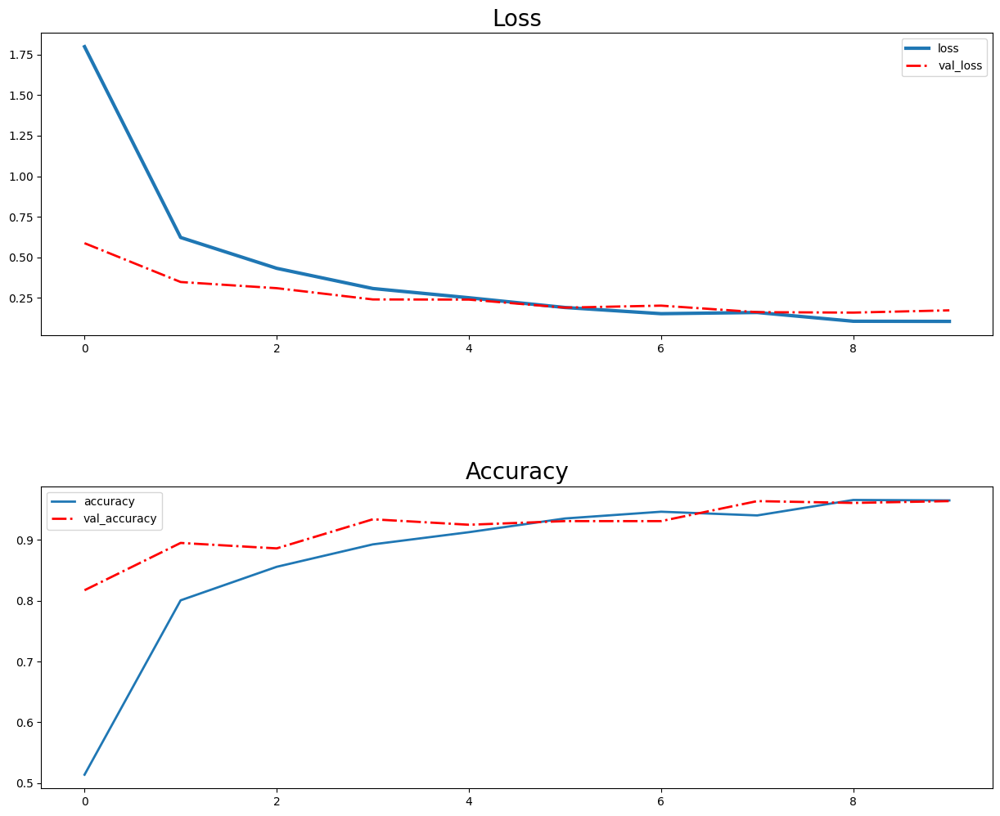

In [ ]:
result_df = pd.read_json('xception.json')

x = np.arange(len(result_df))
fig, ax = plt.subplots(2, 1, figsize=(15, 12))

# AX0 : Loss
ax[0].plot(x, result_df.loss, label='loss', linewidth=3)
ax[0].plot(x, result_df.val_loss, label='val_loss', linewidth=2, ls='-.', c='r')
ax[0].set_title('Loss', fontsize=20)
ax[0].legend()

# AX1 : Accuracy
ax[1].plot(x, result_df.accuracy, label='accuracy', linewidth=2)
ax[1].plot(x, result_df.val_accuracy, label='val_accuracy', linewidth=2, ls='-.', c='r')
ax[1].set_title('Accuracy', fontsize=20)
ax[1].legend()

plt.subplots_adjust(hspace=0.5)
plt.show()

In [ ]:
# Convert the DataFrame to JSON
result_json = result_df.to_json(orient="records")

# Write the JSON data to a file
with open('xception.json', 'w') as f:
    f.write(result_json)


## 3. Visualize the result<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

11/11 [==============================] - 162s 14s/step


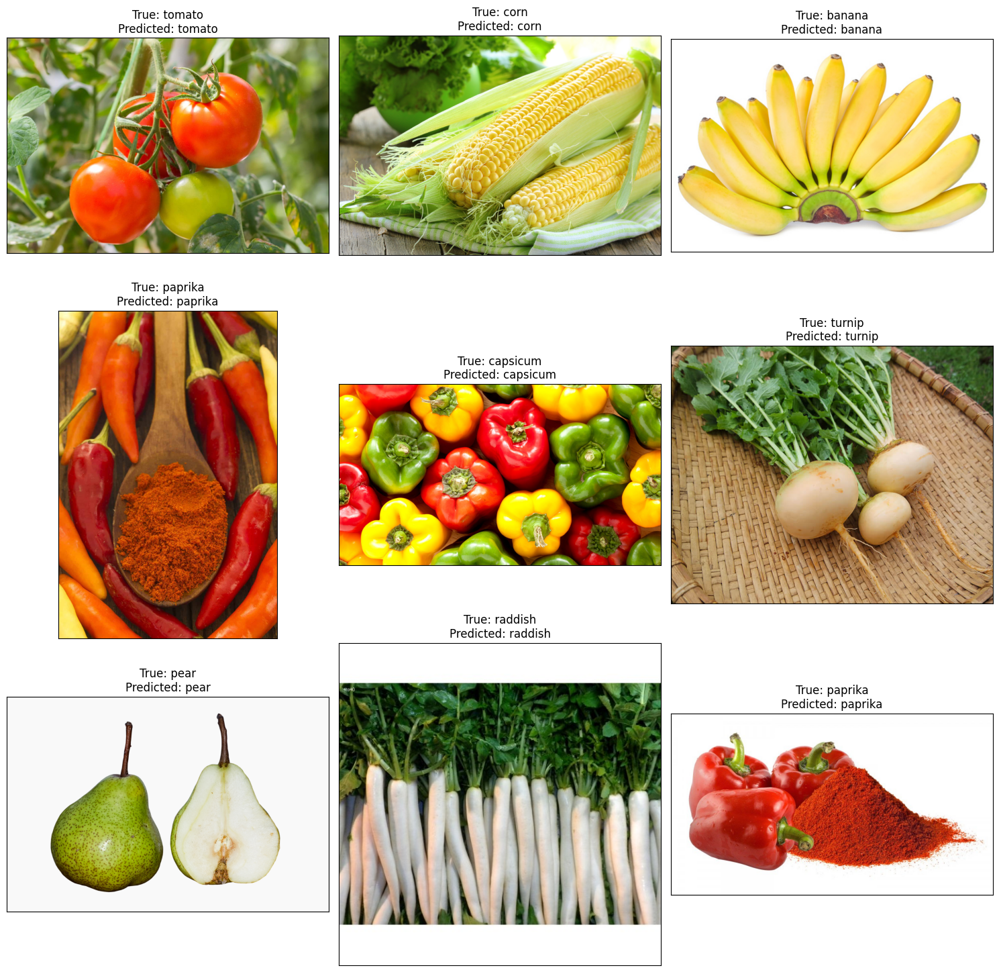

In [ ]:
# Predict the label of the test_images
pred = model_xception.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

y_test = [labels[k] for k in test_images.classes]

# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score
acc = accuracy_score(y_test, pred)
print(f'Accuracy on the test set: {100*acc:.2f}%')

Accuracy on the test set: 96.41%


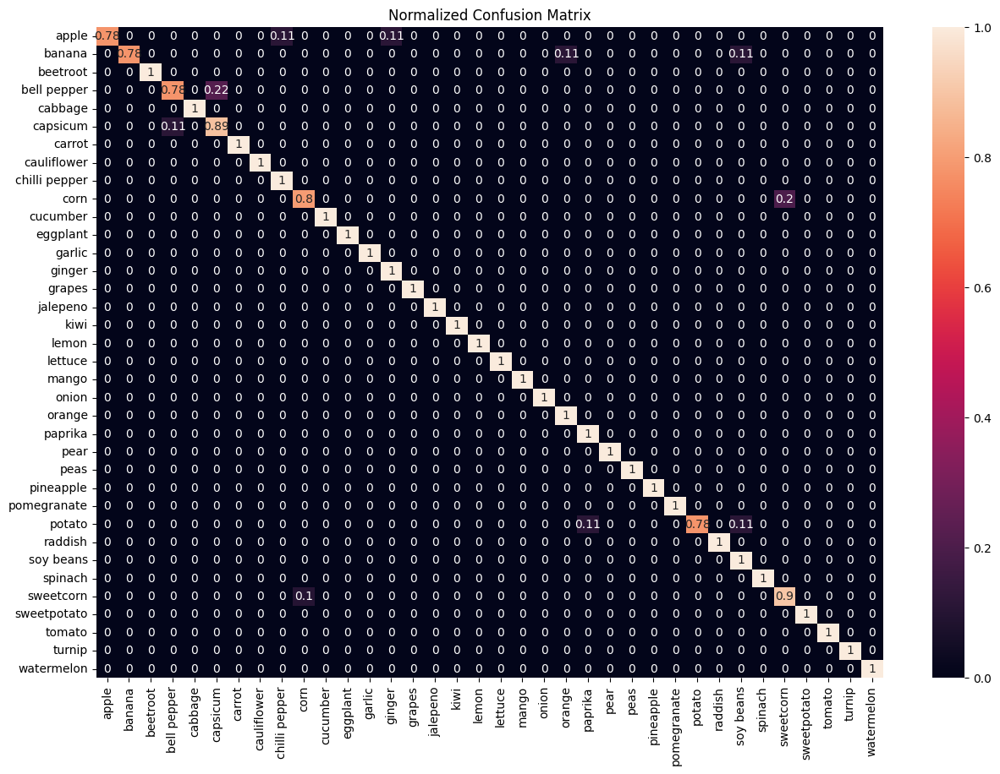

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (15,10))
sns.heatmap(cf_matrix,
            annot=True,
            xticklabels = sorted(set(y_test)),
            yticklabels = sorted(set(y_test)),
            )
plt.title('Normalized Confusion Matrix')
plt.show()

1/1 [==============================] - 2s 2s/step


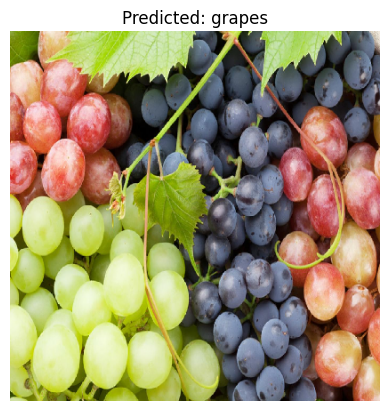

'grapes'

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np

def predict_image_class(model, image_path, show=True):
    img = image.load_img(image_path, target_size=(416, 416))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = tf.keras.applications.vgg16.preprocess_input(expanded_img_array)
    prediction = model.predict(preprocessed_img)
    predicted_class = np.argmax(prediction, axis=1)

    # Assuming 'class_indices' is a dictionary mapping class names to their index
    class_indices = train_images.class_indices
    # Invert the dictionary
    index_to_class = {v: k for k, v in class_indices.items()}
    # Get the class name
    predicted_class_name = index_to_class[predicted_class[0]]

    if show:
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {predicted_class_name}')
        plt.show()

    return predicted_class_name

# Assuming 'model' is your trained model
# Replace 'path_to_your_image.jpg' with the actual path to your image
predict_image_class(model_resnet, '/content/MyDrive/MyDrive/archive/test/grapes/Image_2.jpg')


In [ ]:
model_xception.save('saved_model/XCEPTION_Predictor')
!zip -r XCEPTION_Predictor.zip saved_model/

  adding: saved_model/ (stored 0%)
  adding: saved_model/RESNET_50_Predictor/ (stored 0%)
  adding: saved_model/RESNET_50_Predictor/fingerprint.pb (stored 0%)
  adding: saved_model/RESNET_50_Predictor/variables/ (stored 0%)
  adding: saved_model/RESNET_50_Predictor/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: saved_model/RESNET_50_Predictor/variables/variables.index (deflated 80%)
  adding: saved_model/RESNET_50_Predictor/saved_model.pb (deflated 92%)
  adding: saved_model/RESNET_50_Predictor/keras_metadata.pb (deflated 96%)
  adding: saved_model/RESNET_50_Predictor/assets/ (stored 0%)
  adding: saved_model/XCEPTION_Predictor/ (stored 0%)
  adding: saved_model/XCEPTION_Predictor/fingerprint.pb (stored 0%)
  adding: saved_model/XCEPTION_Predictor/variables/ (stored 0%)
  adding: saved_model/XCEPTION_Predictor/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: saved_model/XCEPTION_Predictor/variables/variables.index (deflated 79%)
  adding: saved_model/XCE

# 6. Ai Recipe-Recaller<a class="anchor" id="1"></a><a class="anchor" id="1"></a>

# Yolo v8

In [ ]:
from ultralytics import YOLO

data_dir= r'D:\Programming\Projects\Minor Project\DataSet\archive'
model=YOLO('yolov8n-cls.pt')

result=model.train(data = data_dir,epochs=10,imgsz=640)



# We are using Medium version of yolov8,TO use small use n after 8,to use large use l
# Putting higher number as v8 will automatically perfom Early stopping if model performance not increasing over time


# def delete_iccfile(image_path):
#     img = Image.open(image_path)
#     img.info.pop('icc_profile', None)
#     img.save(image_path)


In [ ]:
from ultralytics import YOLO
import cv2
import streamlit as st
from PIL import Image
import numpy as np


modelpath =r"D:\Programming\Projects\Minor Project\Yolo\runs\classify\train\weights\best.pt"
model=YOLO(modelpath)

st.title('Drop your image')
image=st.file_uploader('upload image',type=['png','jpg','jpeg','gif'])
if image:
    image=Image.open(image)
    st.image(image=image)
    result=model(image)
    names=result[0].names
    probability=result[0].probs.data.numpy()
    prediction=np.argmax(probability)
    st.write(f'Prediction is {names[prediction].upper()}')


# imgpath=r"D:\Programming\Projects\Minor Project\DataSet\test\cabbage\Image_2.jpg"

# img=cv2.imread(imgpath)
# model=YOLO(modelpath)

# result=model(img)
# names=result[0].names
# probability=result[0].probs.data.numpy()
# prediction=np.argmax(probability)
# print(names[prediction])